## Gradient Boosting Example

In [1]:
import os
from glob import glob
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix as CM
from airxd.mask import *
from airxd.model import ARIXD
from airxd.utilities import Dataset, parse_imctrl

## Create/load data

In [2]:
dataset = Dataset()
images = dataset.get_images('../data')
labels = np.zeros_like(images)
mask = MASK(controls=parse_imctrl('../data/Si_ch3_d700-00000.imctrl'), 
            shape=(2880,2880))

if os.path.isdir('../data/masks'):
    for i in range(len(images)):
        label = np.load(f'../data/masks/{i}.npy')
        labels[i] += label
else:
    os.mkdir('../data/masks')
    for i, image in enumerate(images):
        result = mask.AutoSpotMask(image, esdmul=7.0)
        labels[i] += result
        np.save(f'../data/masks/{i}', result)

## Visualize masking result

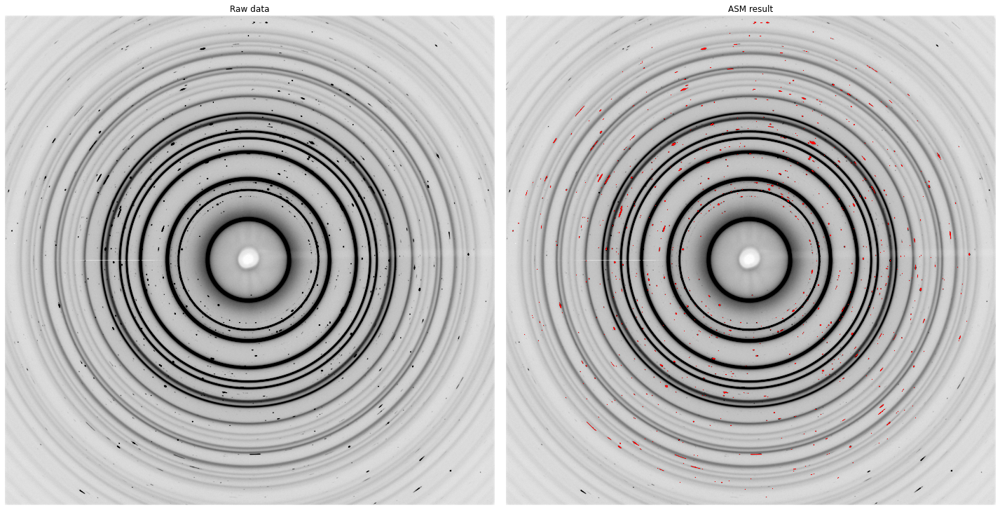

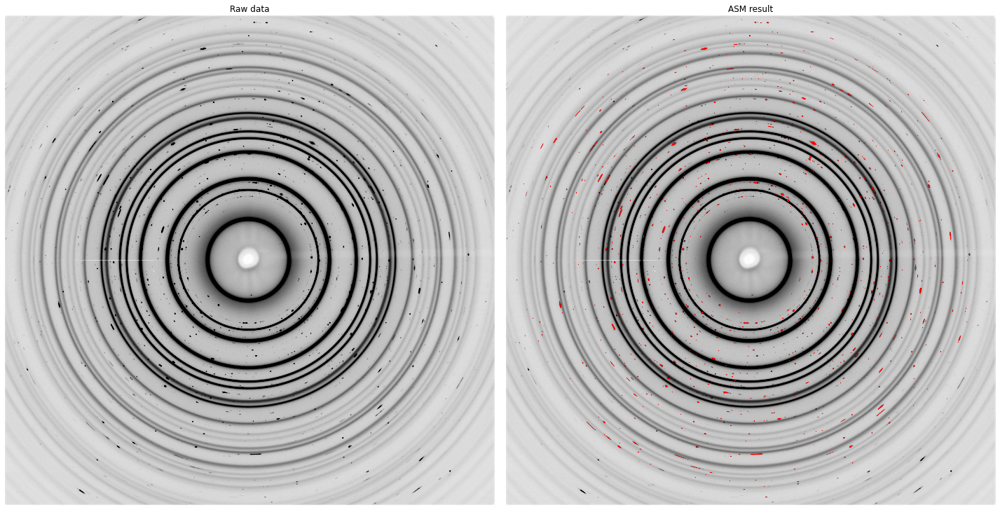

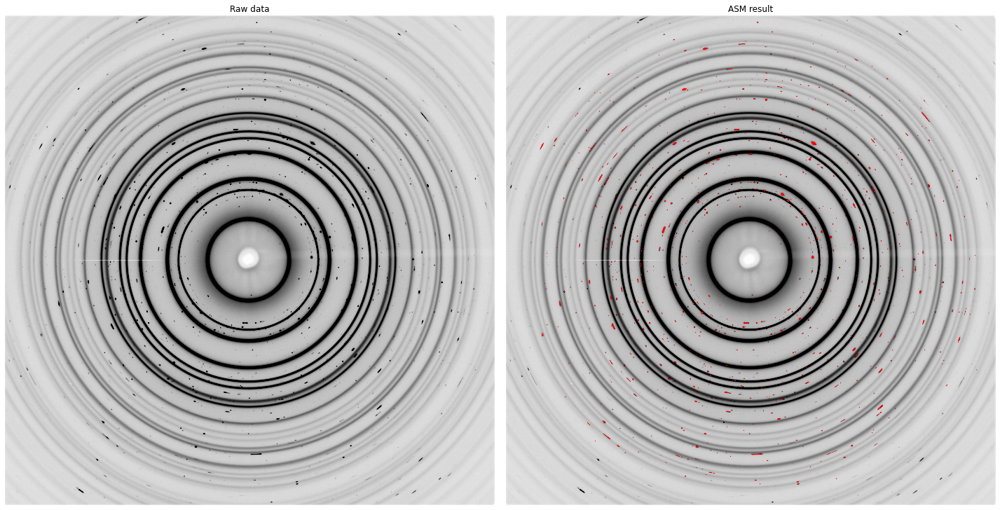

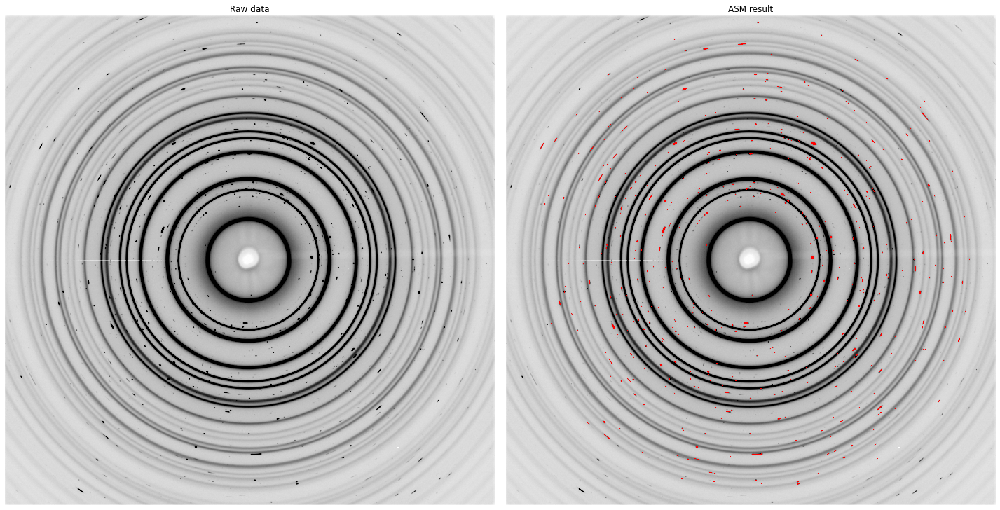

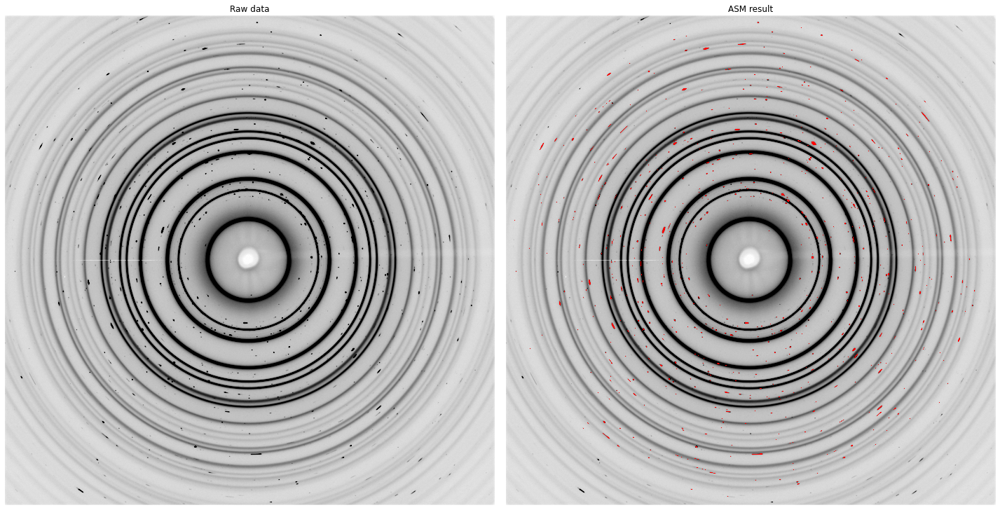

...

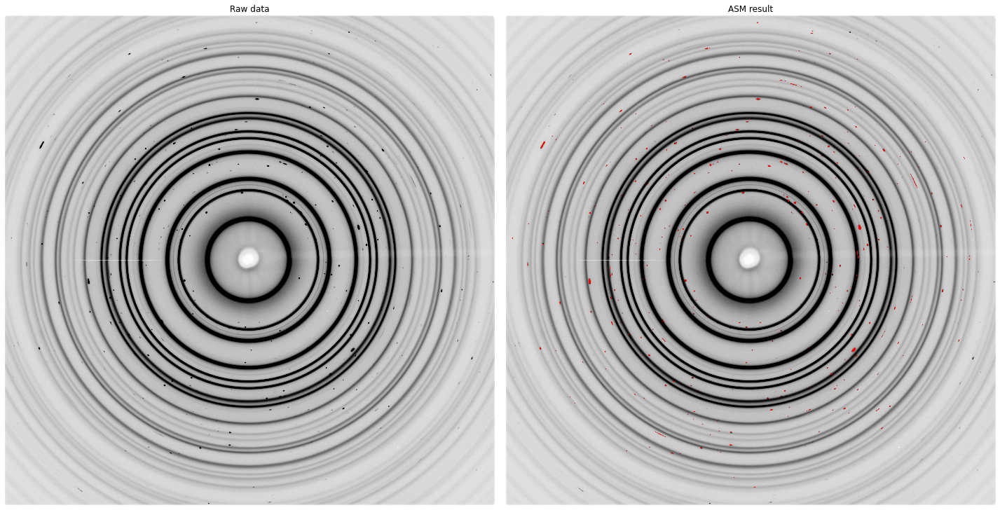

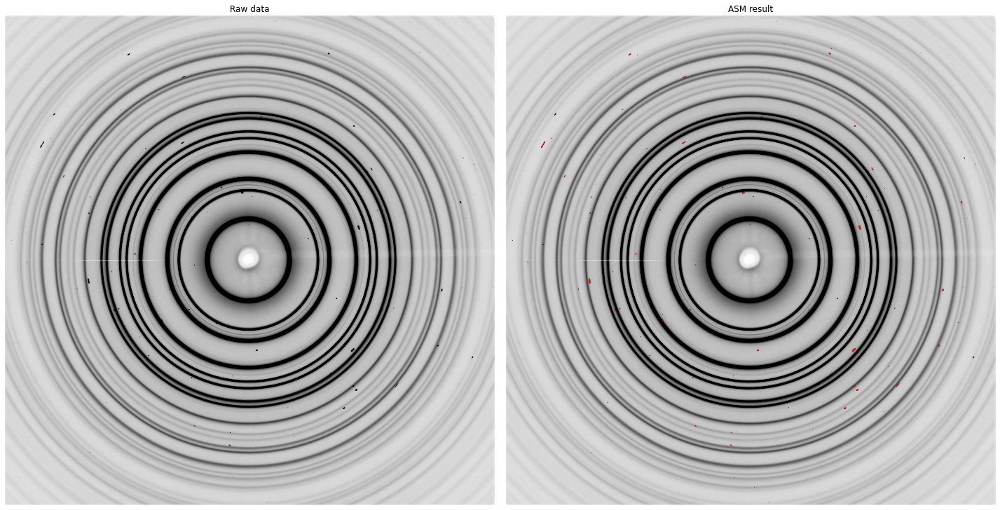

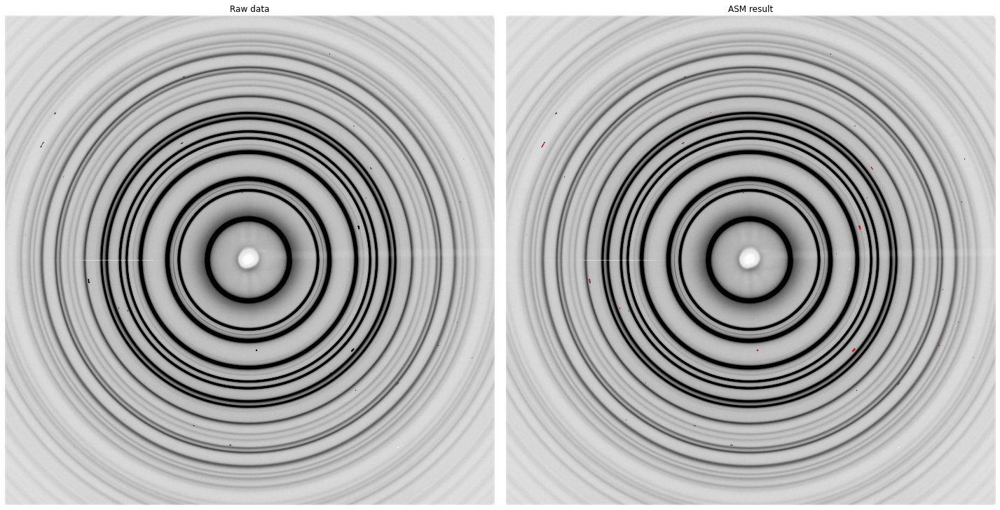

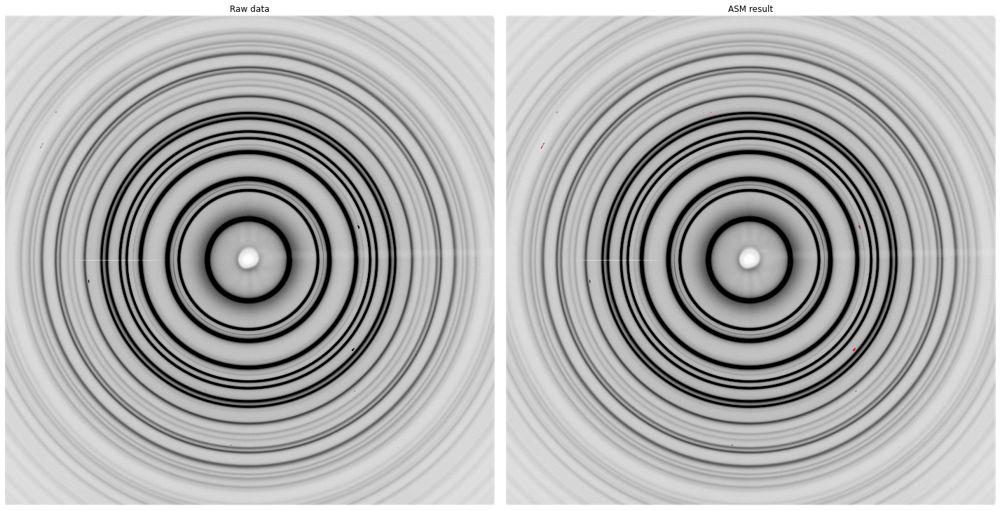

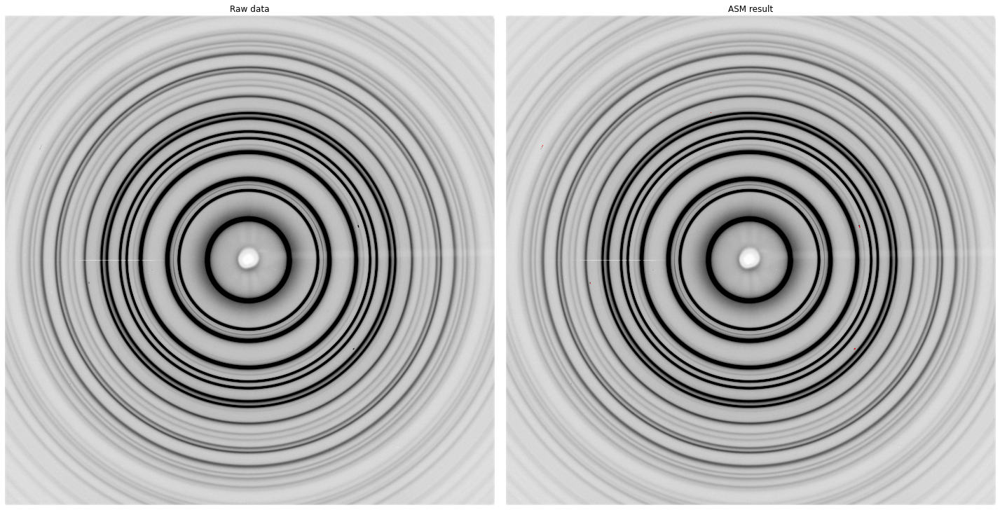

In [3]:
for i, (image, label) in enumerate(zip(images, labels)):
    lbl = np.array(label, dtype=float)
    lbl = np.ma.masked_where(lbl==0., lbl)
    plt.figure(figsize=(20,10))
    plt.subplot(1,2,1)
    plt.imshow(image, vmin=0, vmax=15000, cmap='binary', origin='lower')
    plt.title('Raw data')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(image, vmin=0, vmax=15000, cmap='binary', origin='lower')
    plt.imshow(lbl, cmap=cm.autumn, origin='lower', interpolation='nearest')
    plt.title('ASM result')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

## Gradient boosting training

In [4]:
# Setting up parameters
device = 'cpu'
tree_method = 'hist' if device == 'cpu' else 'gpu_hist'
predictor = 'cpu_predictor' if device == 'cpu' else 'gpu_predictor'

algorithm = 'gradient_boosting'
parameters = {'n_estimators': 100,
              'eta': 0.3,
              'tree_method': tree_method,
              'gamma': 0.,
              'max_bin': 10000,
              'predictor': predictor,
              'max_depth': 10,
              'reg_lambda': 1.,
              'eval_metric': 'rmsle',
              'n_jobs': -1}
features = {'intensity': True,
            'angle': True,
            'locations': False}

model = ARIXD(algorithm, parameters, features, mask.TA)
model.train(images, labels, include_data='random')

Images used for training: [8, 3, 2]


## Prediction

In [5]:
for i, (image, label) in enumerate(zip(images, labels)):
    label_pred = model.predict(image)
    matrix = CM(label.ravel(), label_pred.ravel())
    tn, fp, fn, tp = matrix.ravel()
    tn_rate = tn/(fp+tn)*100
    tp_rate = tp/(fn+tp)*100
    print(f"Image {i}")
    print(f'True Negative   : {tn}')
    print(f'False Positive  : {fp}')
    print(f'False Negative  : {fn}')
    print(f'True Positive   : {tp}')
    print(f'True TN rate    : {round(tn_rate,1)} %')
    print(f'True TP rate    : {round(tp_rate,1)} %')
    print('\n')

Image 0
True Negative   : 8262800
False Positive  : 296
False Negative  : 775
True Positive   : 30529
True TN rate    : 100.0 %
True TP rate    : 97.5 %


Image 1
True Negative   : 8260137
False Positive  : 708
False Negative  : 519
True Positive   : 33036
True TN rate    : 100.0 %
True TP rate    : 98.5 %


Image 2
True Negative   : 8265425
False Positive  : 57
False Negative  : 144
True Positive   : 28774
True TN rate    : 100.0 %
True TP rate    : 99.5 %


Image 3
True Negative   : 8266535
False Positive  : 22
False Negative  : 172
True Positive   : 27671
True TN rate    : 100.0 %
True TP rate    : 99.4 %


Image 4
True Negative   : 8267854
False Positive  : 149
False Negative  : 571
True Positive   : 25826
True TN rate    : 100.0 %
True TP rate    : 97.8 %


Image 5
True Negative   : 8274224
False Positive  : 1036
False Negative  : 253
True Positive   : 18887
True TN rate    : 100.0 %
True TP rate    : 98.7 %


Image 6
True Negative   : 8282126
False Positive  : 714
False Negative 

## Visualize prediction

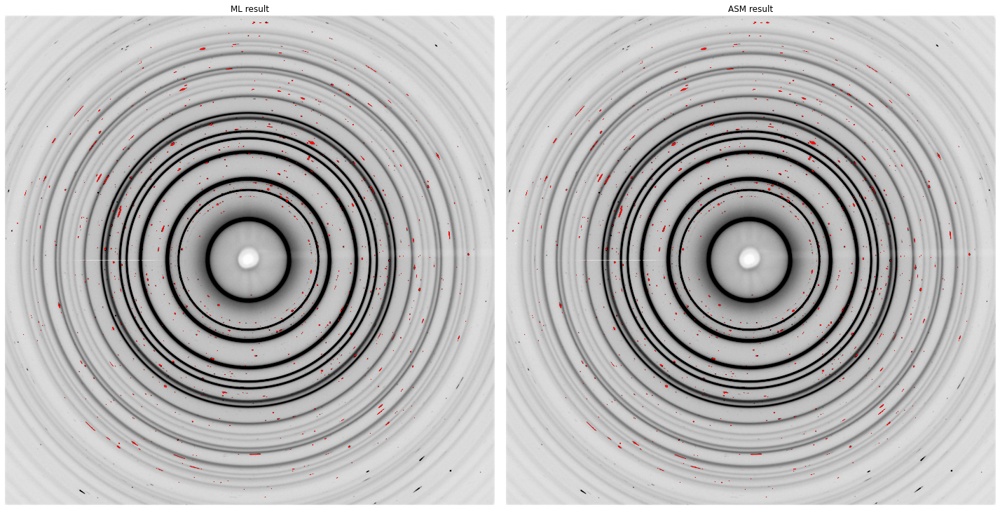

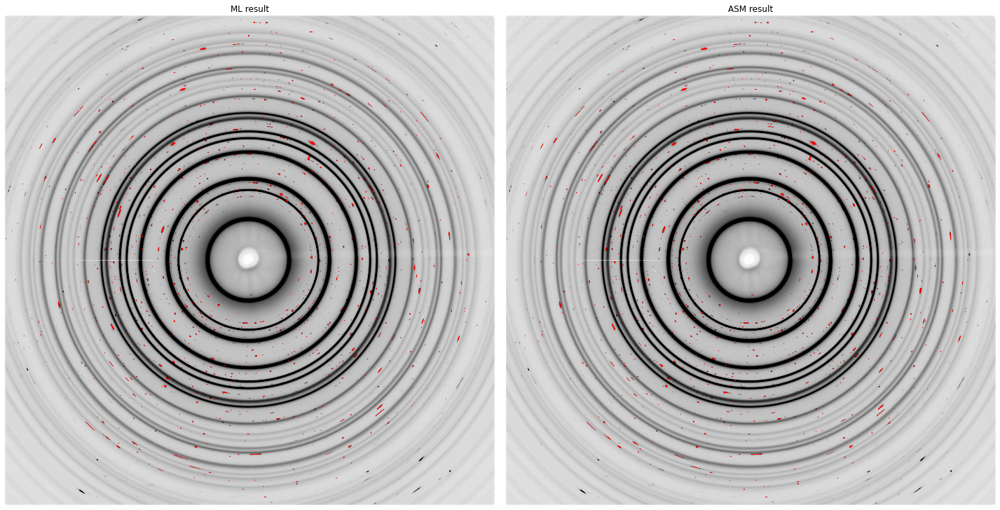

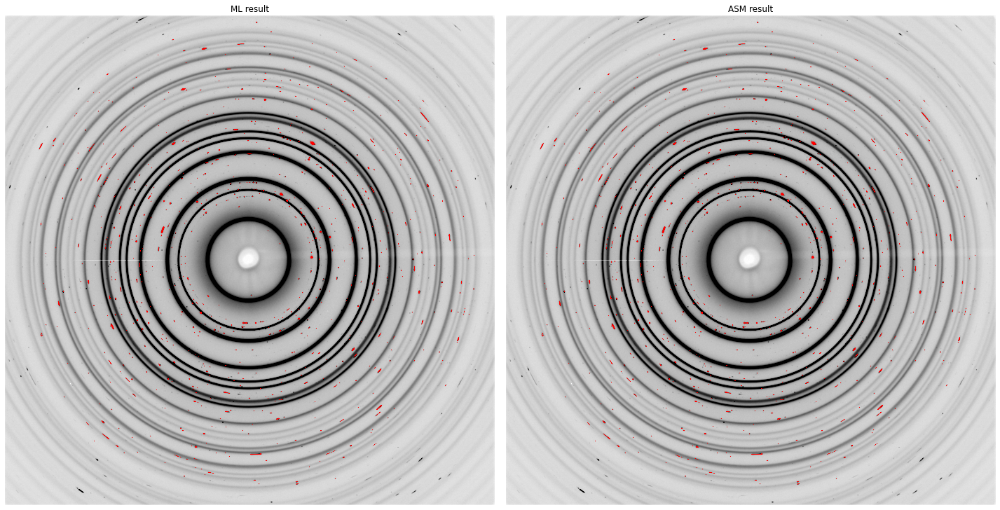

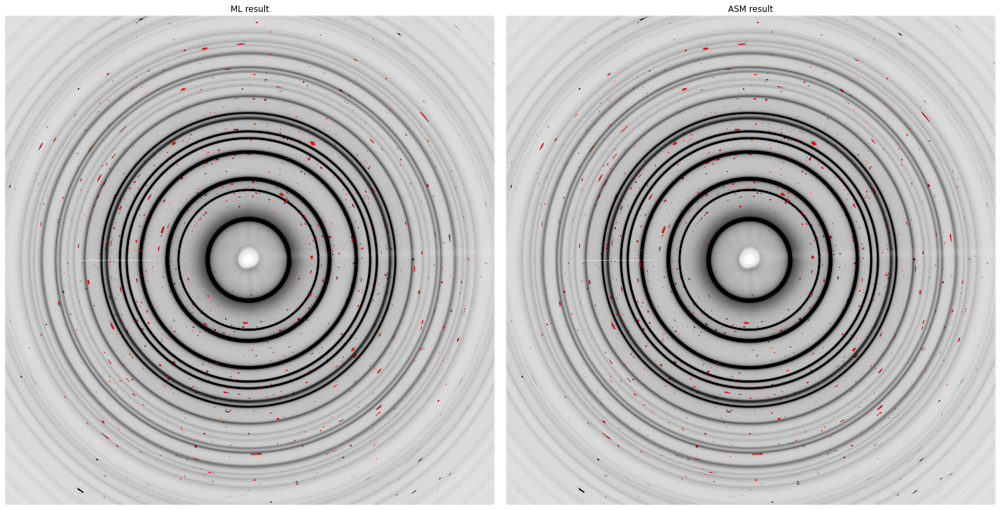

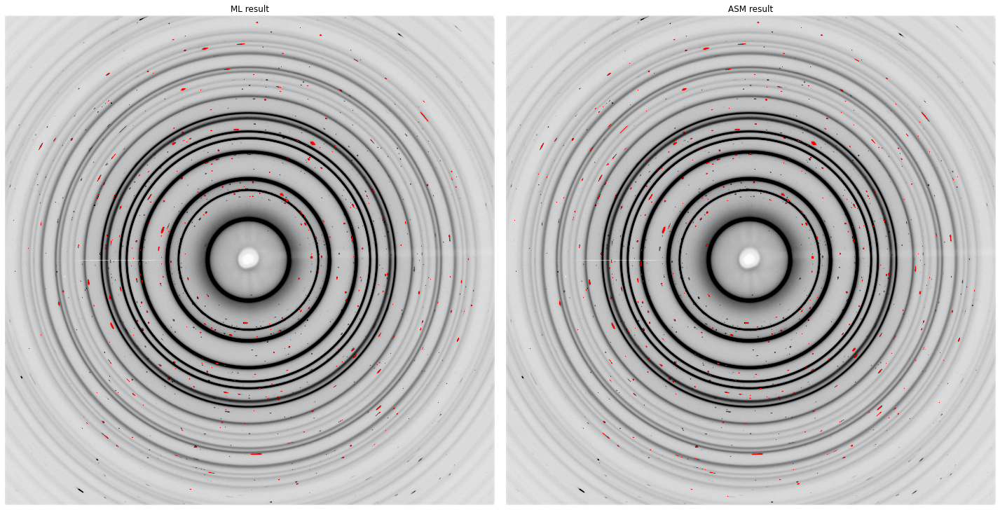

...

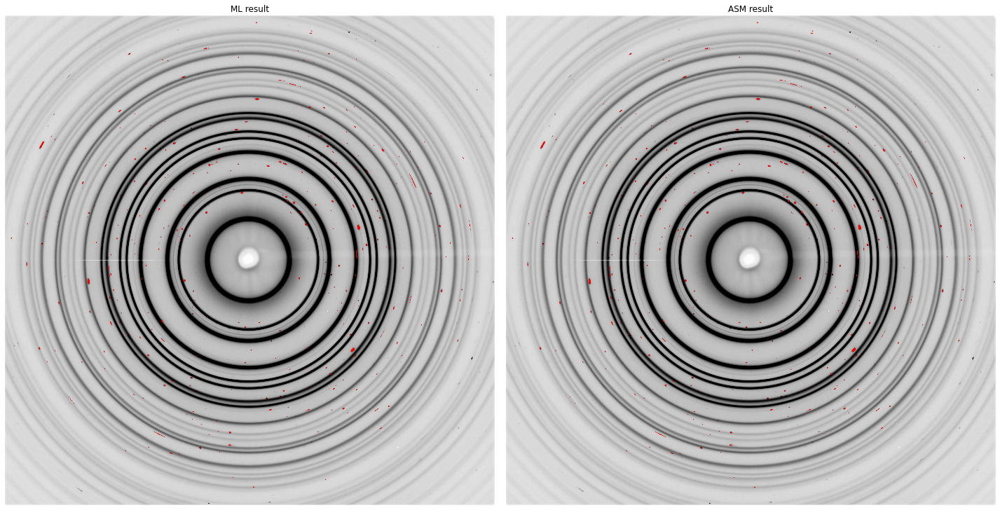

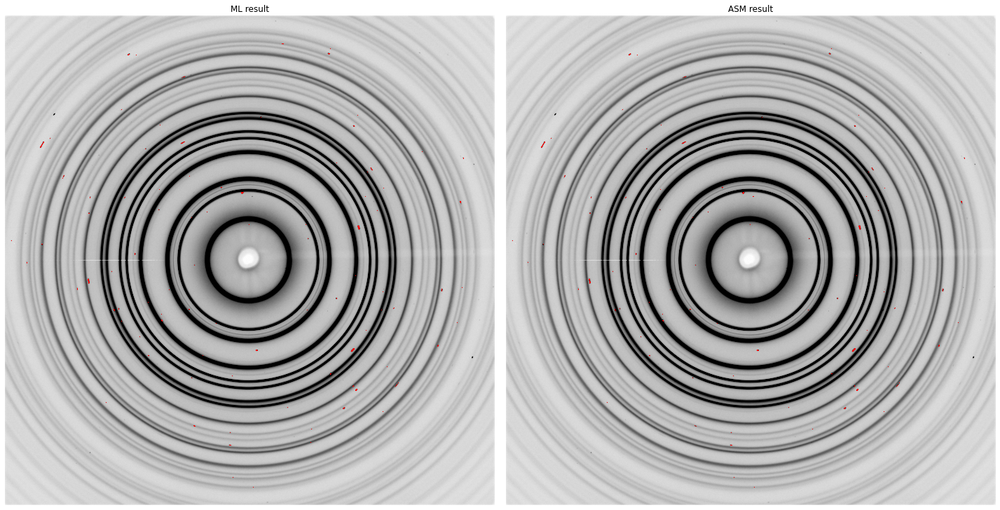

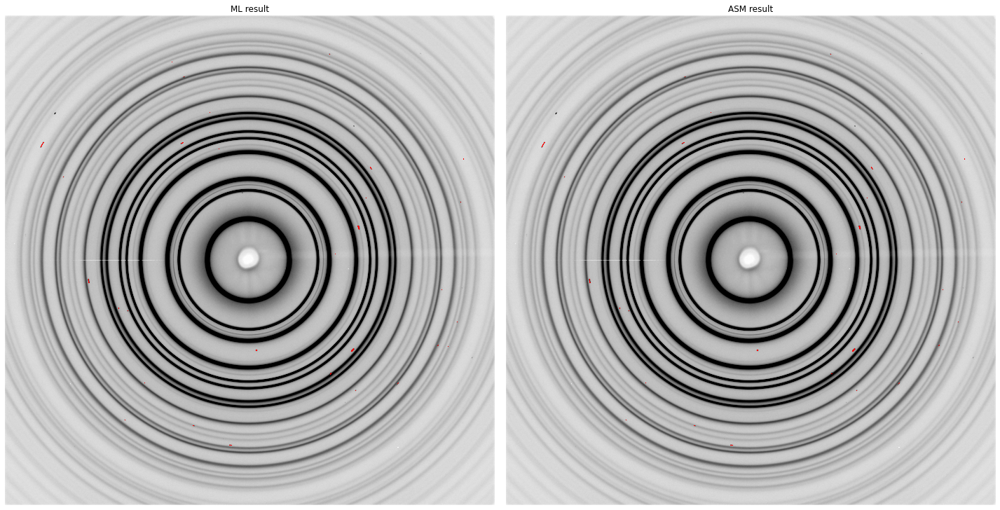

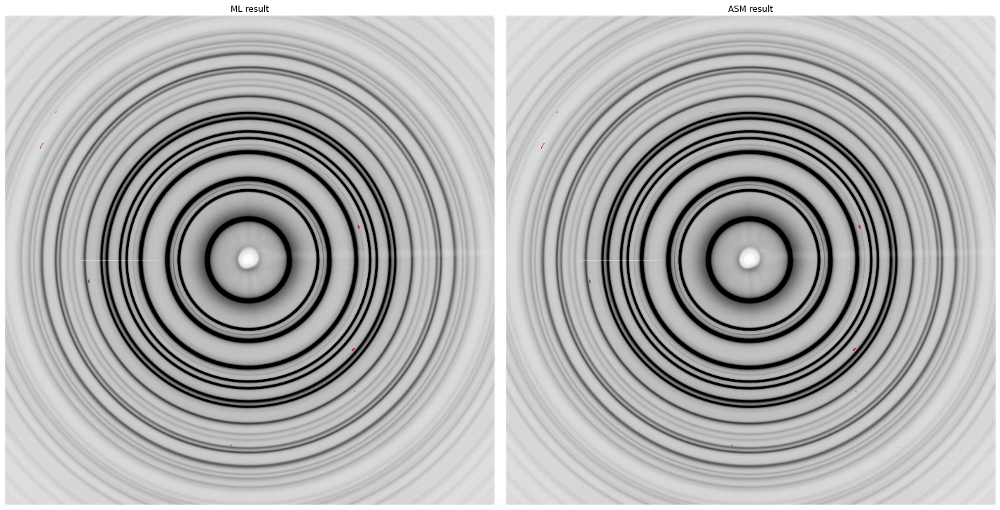

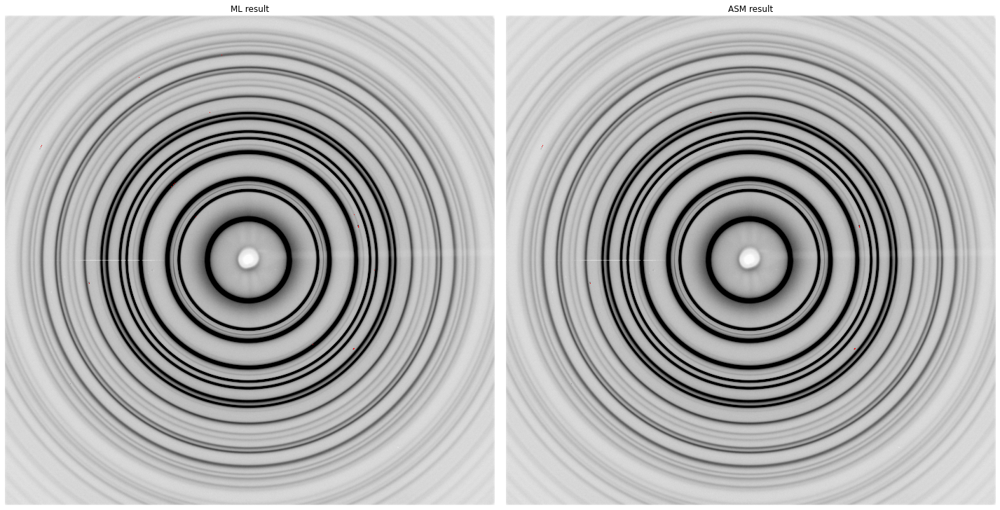

In [6]:
for image, label in zip(images, labels):
    label_pred = model.predict(image)
    lbl0 = np.array(label_pred, dtype=float)
    lbl0 = np.ma.masked_where(lbl0==0., lbl0)
    lbl1 = np.array(label, dtype=float)
    lbl1 = np.ma.masked_where(lbl1==0., lbl1)
    
    plt.figure(figsize=(20,10))
    # ML result
    plt.subplot(1,2,1)
    plt.imshow(image, vmin=0, vmax=15000, cmap='binary', origin='lower')
    plt.imshow(lbl0, cmap=cm.autumn, origin='lower', interpolation='nearest')
    plt.title('ML result')
    plt.axis('off')
    # ASM search
    plt.subplot(1,2,2)
    plt.imshow(image, vmin=0, vmax=15000, cmap='binary', origin='lower')
    plt.imshow(lbl1, cmap=cm.autumn, origin='lower', interpolation='nearest')
    plt.title('ASM result')
    plt.axis('off')
    plt.tight_layout()
    plt.show()